In [1]:
import mamba_error_reporting as mer


def detail_problem(pb_factory):
    solver, pool = pb_factory()
    success = solver.solve()
    if success:
        raise RuntimeError(f"{pb_factory.__name__} was solved successfully")

    print("{:=^120}".format(" Old error message "))
    print(mer.messaging.old_error_report(solver))
    print("{:=^120}".format(" Original graph "))
    pb_data = mer.algorithm.ProblemData.from_libsolv(solver, pool)
    mer.plot.plot_solvable_dag(pb_data)
    print("{:=^120}".format(" Compressed graph "))
    cp_data = mer.algorithm.compress_graph(pb_data)
    mer.plot.plot_group_dag(pb_data, cp_data)
    print("{:=^120}".format(" New error message "))
    print(mer.algorithm.explain_graph(pb_data, cp_data))

# Basic Conflict

================================================== Old error message ===================================================
Mamba failed to solve. The reported errors are:
   Encountered problems while solving:
     - nothing provides requested a 0.4.0**
   
==================================================== Original graph ====================================================


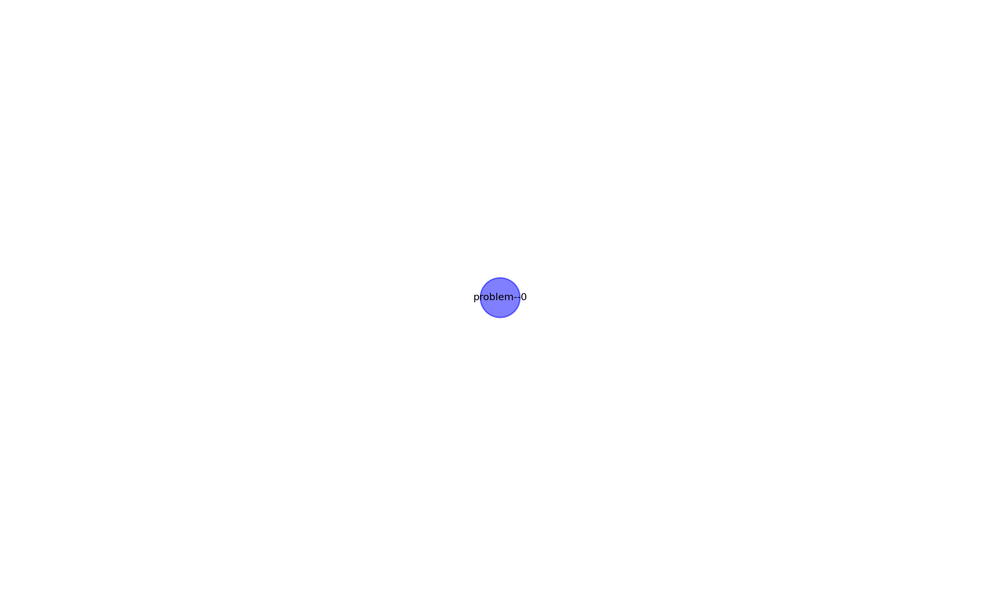

=================================================== Compressed graph ===================================================


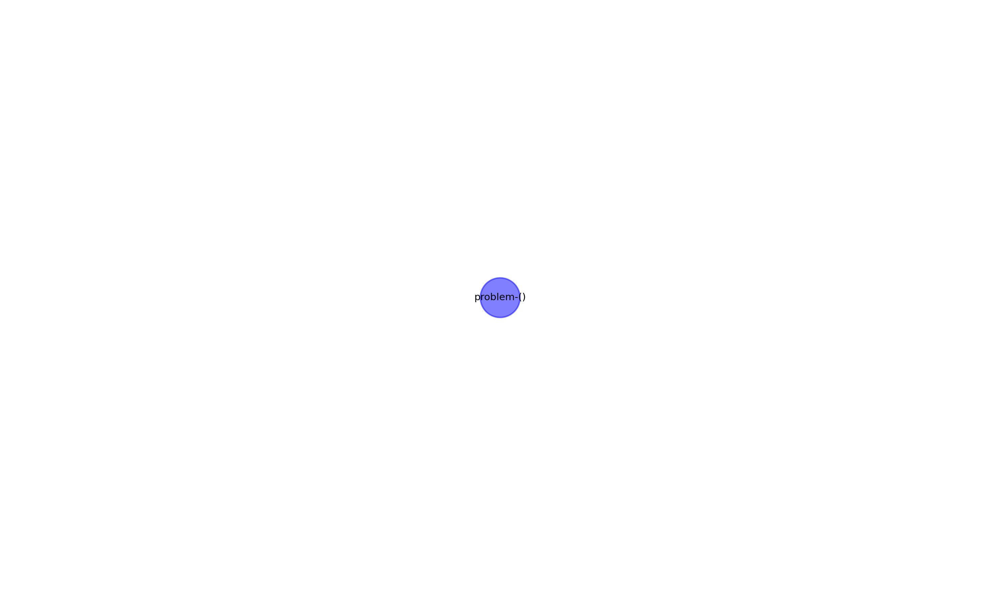

================================================== New error message ===================================================
Error: The environment could not be satisfied because it requires the missing package a 0.4.0**.


In [2]:
detail_problem(mer.problems.create_basic_conflict)

# PubGrub

================================================== Old error message ===================================================
Mamba failed to solve. The reported errors are:
   Encountered problems while solving:
     - package menu-1.0.0 requires dropdown 1.**, but none of the providers can be installed
   
==================================================== Original graph ====================================================


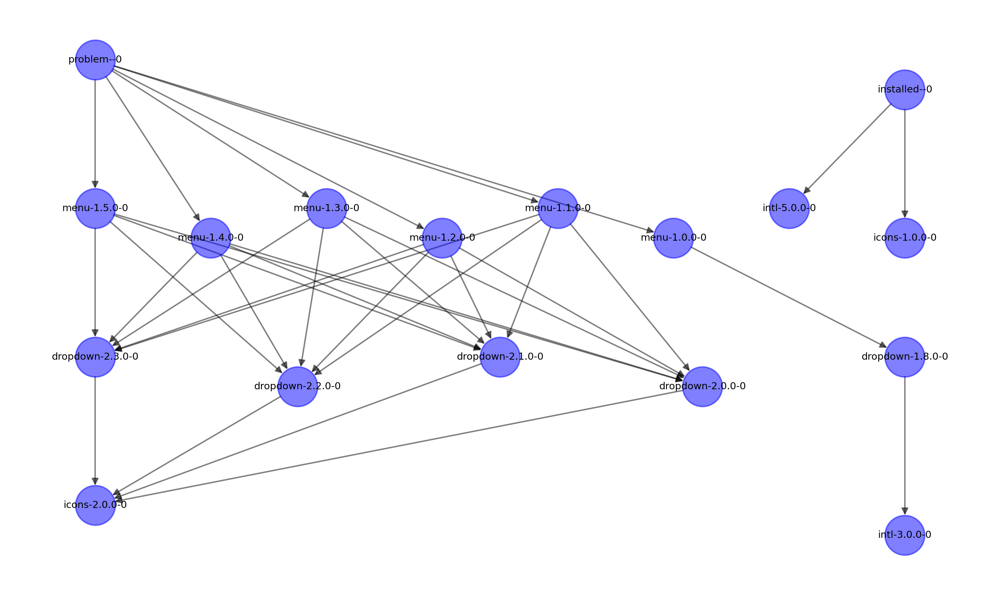

=================================================== Compressed graph ===================================================


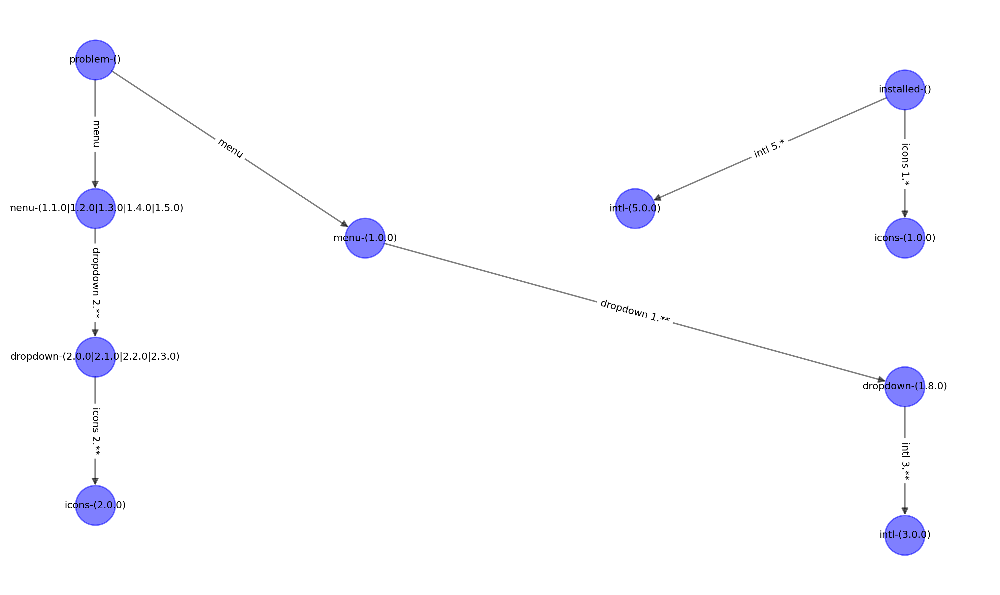

================================================== New error message ===================================================
Error: Could not find any installable versions for requested package menu.

The following requirements limit the allowed versions of downstream packages:
  icons 1.* is directly requested;
  intl 5.* is directly requested.

The following packages could not be installed:
  menu for which none of the following versions can be installed
    menu [1.0.0] which requires
      dropdown 1.** which requires
        intl 3.**, which conflicts with any installable versions of intl;
    menu [1.3.0|1.2.0|1.5.0|1.1.0|1.4.0] which requires
      dropdown 2.** which requires
        icons 2.**, which conflicts with any installable versions of icons.


In [3]:
detail_problem(mer.problems.create_pubgrub)

# PubGrub Hard

================================================== Old error message ===================================================
Mamba failed to solve. The reported errors are:
   Encountered problems while solving:
     - package menu-1.2.0 requires dropdown 2.**, but none of the providers can be installed
   
==================================================== Original graph ====================================================


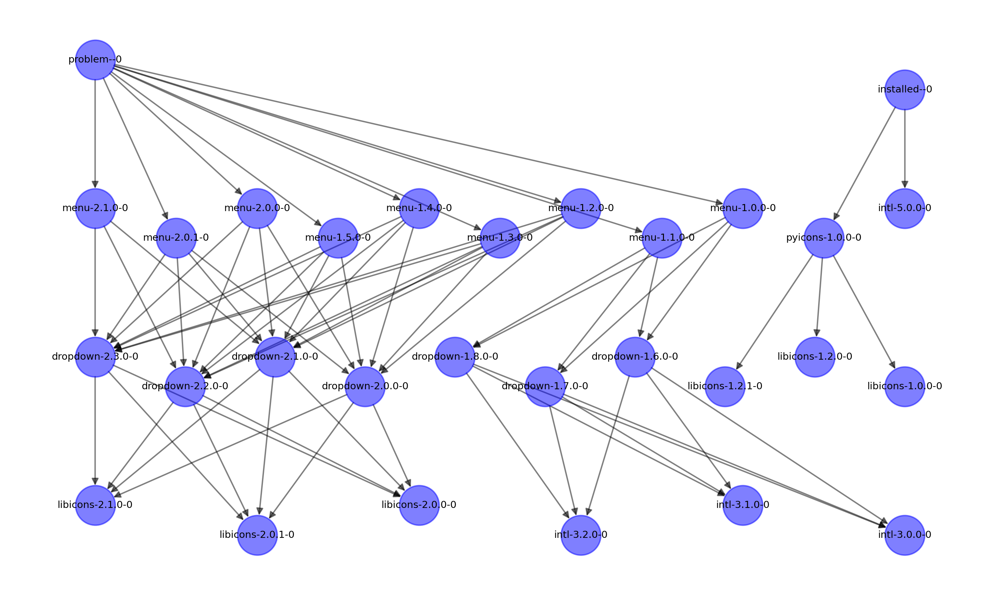

=================================================== Compressed graph ===================================================


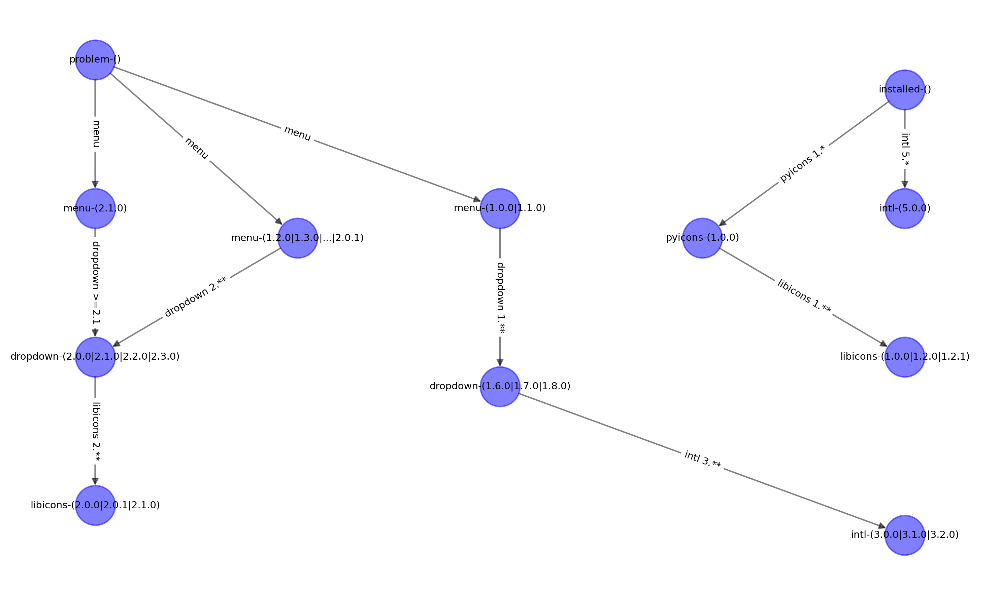

================================================== New error message ===================================================
Error: Could not find any installable versions for requested package menu.

The following requirements limit the allowed versions of downstream packages:
  intl 5.* is directly requested;
  pyicons 1.* is requested, and it requires
    libicons 1.**, which can be installed.

The following packages could not be installed:
  menu for which none of the following versions can be installed
    menu [1.1.0|1.0.0] which requires
      dropdown 1.** which requires
        intl 3.**, which conflicts with any installable versions of intl;
    menu [1.3.0|2.0.0|...|1.4.0|2.0.1] which requires
      dropdown 2.** which requires
        libicons 2.**, which conflicts with any installable versions of libicons;
    menu [2.1.0] which requires
      dropdown >=2.1, which cannot be installed (as previously explained).


In [4]:
detail_problem(mer.problems.create_pubgrub_hard)

# PubGrub Missing

================================================== Old error message ===================================================
Mamba failed to solve. The reported errors are:
   Encountered problems while solving:
     - nothing provides libnothere >1.0 needed by dropdown-2.9.3
   
==================================================== Original graph ====================================================


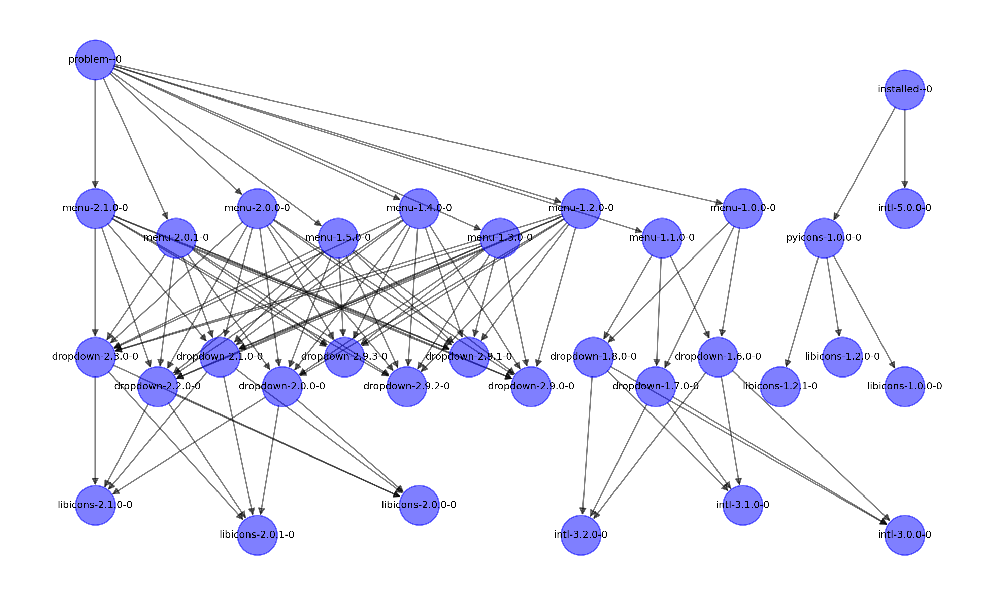

=================================================== Compressed graph ===================================================


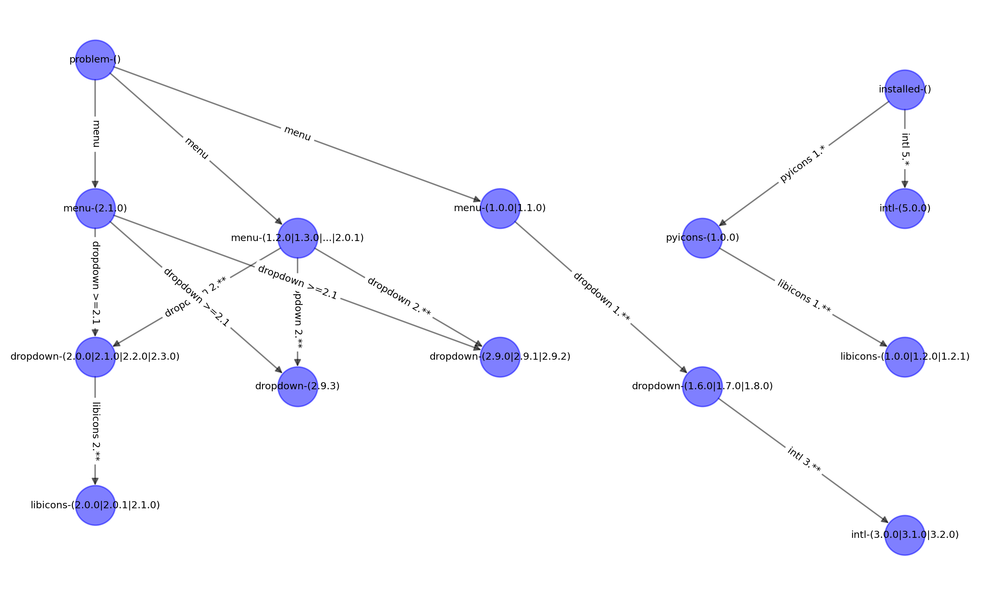

================================================== New error message ===================================================
Error: Could not find any installable versions for requested package menu.

The following requirements limit the allowed versions of downstream packages:
  intl 5.* is directly requested;
  pyicons 1.* is requested, and it requires
    libicons 1.**, which can be installed.

The following packages could not be installed:
  menu for which none of the following versions can be installed
    menu [1.1.0|1.0.0] which requires
      dropdown 1.** which requires
        intl 3.**, which conflicts with any installable versions of intl;
    menu [1.3.0|2.0.0|...|1.4.0|2.0.1] which requires
      dropdown 2.** for which none of the following versions can be installed
        dropdown [2.9.1|2.9.0|2.9.2], which requires the missing package libicons >10.0;
        dropdown [2.9.3], which requires the missing package libnothere >1.0;
        dropdown [2.3.0|2.0.0|2.1.0|2.2.0] wh

In [5]:
detail_problem(mer.problems.create_pubgrub_missing)

# R Base

================================================== Old error message ===================================================
Mamba failed to solve. The reported errors are:
   Encountered problems while solving:
     - package r-matchit-4.3.3-r40h03ef668_0 requires r-base >=4.0,<4.1.0a0, but none of the providers can be installed
   
==================================================== Original graph ====================================================


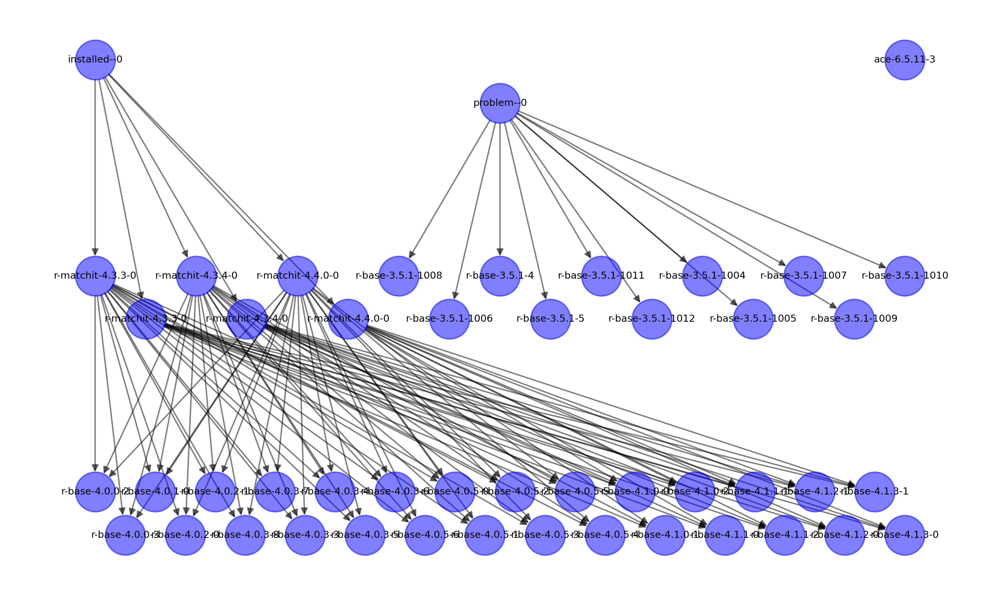

=================================================== Compressed graph ===================================================


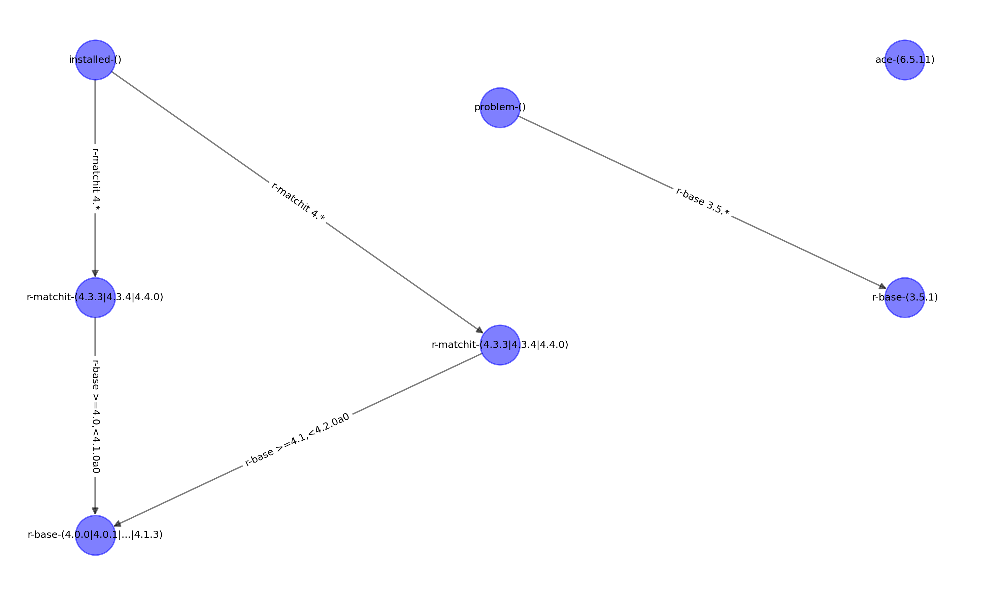

================================================== New error message ===================================================
Error: Could not find any installable versions for requested package r-base 3.5.*.

The following requirements limit the allowed versions of downstream packages:
  r-matchit 4.* is requested, with the potential options
    r-matchit [4.3.4|4.4.0|4.3.3], which requires
      r-base >=4.1,<4.2.0a0, which can be installed;
    r-matchit [4.3.4|4.4.0|4.3.3], which requires
      r-base >=4.0,<4.1.0a0, which can be installed.

The following packages could not be installed:
  r-base 3.5.*, which conflicts with any installable versions of r-base.


In [6]:
detail_problem(mer.problems.create_r_base)

# Pytorch CPU

conda-forge/linux-64                                        Using cache
conda-forge/noarch                                          Using cache
================================================== Old error message ===================================================
Mamba failed to solve. The reported errors are:
   Encountered problems while solving:
     - nothing provides __cuda needed by pytorch-1.11.0-cuda102py310hdf4a2db_202
   
==================================================== Original graph ====================================================


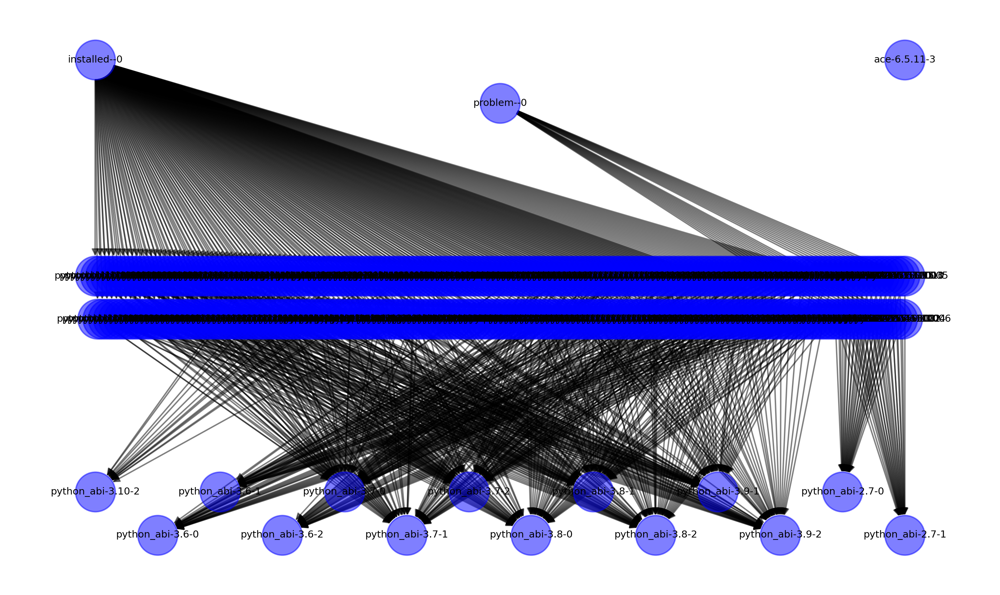

=================================================== Compressed graph ===================================================


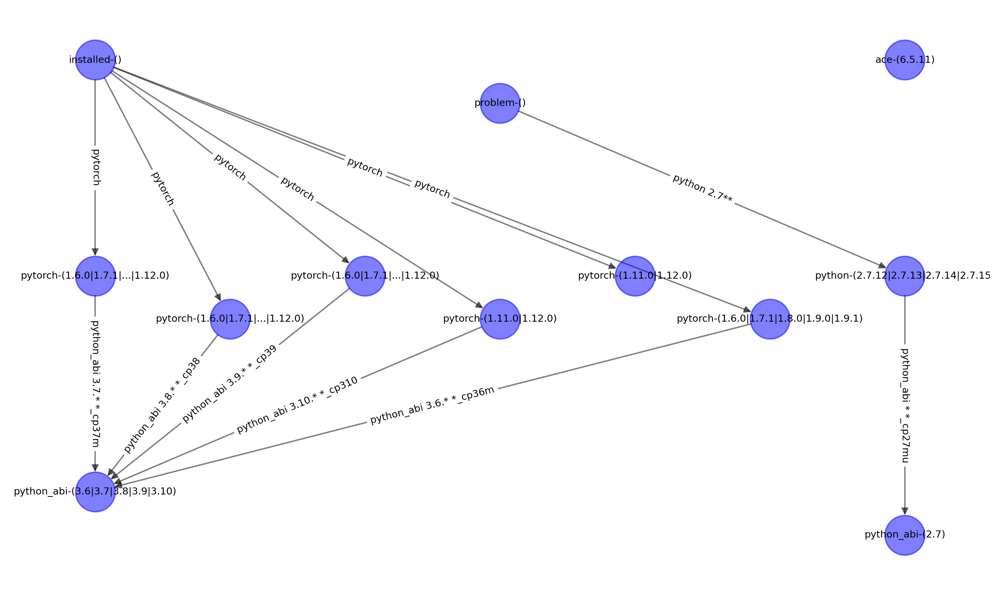

================================================== New error message ===================================================
Error: Could not find any installable versions for requested package python 2.7**.

The following requirements limit the allowed versions of downstream packages:
  pytorch is requested, with the potential options
    pytorch [1.8.0|1.9.1|1.6.0|1.7.1|1.9.0], which requires
      python_abi 3.6.* *_cp36m, which can be installed;
    pytorch [1.12.0|1.11.0], which requires the non-existent package __cuda;
    pytorch [1.12.0|1.11.0], which requires
      python_abi 3.10.* *_cp310, which can be installed;
    pytorch [1.12.0|1.8.0|...|1.7.1|1.9.0], which requires
      python_abi 3.9.* *_cp39, which can be installed;
    pytorch [1.12.0|1.8.0|...|1.7.1|1.9.0], which requires
      python_abi 3.8.* *_cp38, which can be installed;
    pytorch [1.12.0|1.8.0|...|1.7.1|1.9.0], which requires
      python_abi 3.7.* *_cp37m, which can be installed.

The following packages could

In [7]:
detail_problem(mer.problems.create_pytorch_cpu)

# Pytorch Cuda

conda-forge/linux-64                                        Using cache
conda-forge/noarch                                          Using cache
================================================== Old error message ===================================================
Mamba failed to solve. The reported errors are:
   Encountered problems while solving:
     - package pytorch-1.11.0-cpu_py310h2272b30_0 requires python_abi 3.10.* *_cp310, but none of the providers can be installed
   
==================================================== Original graph ====================================================


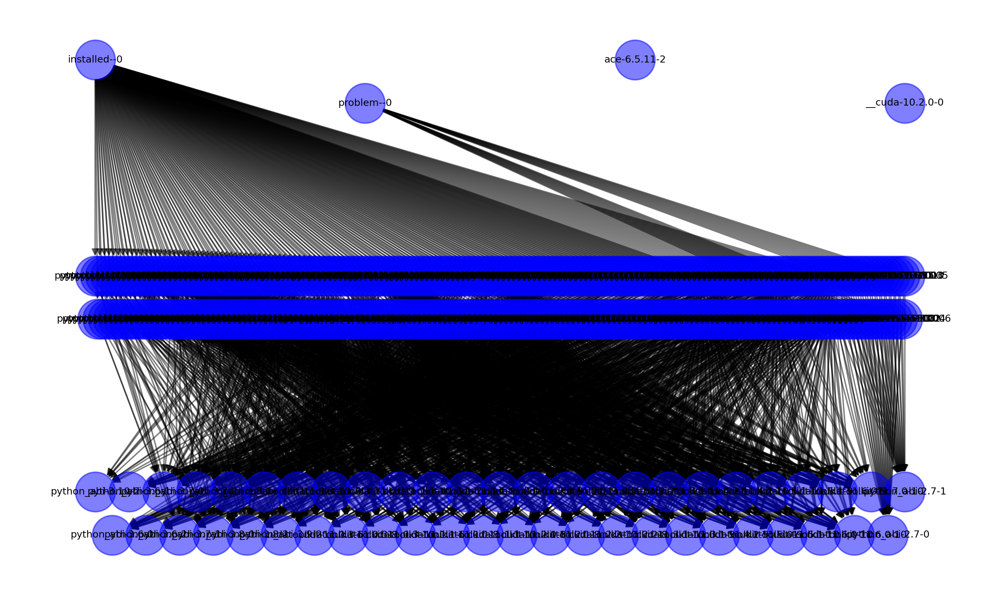

=================================================== Compressed graph ===================================================


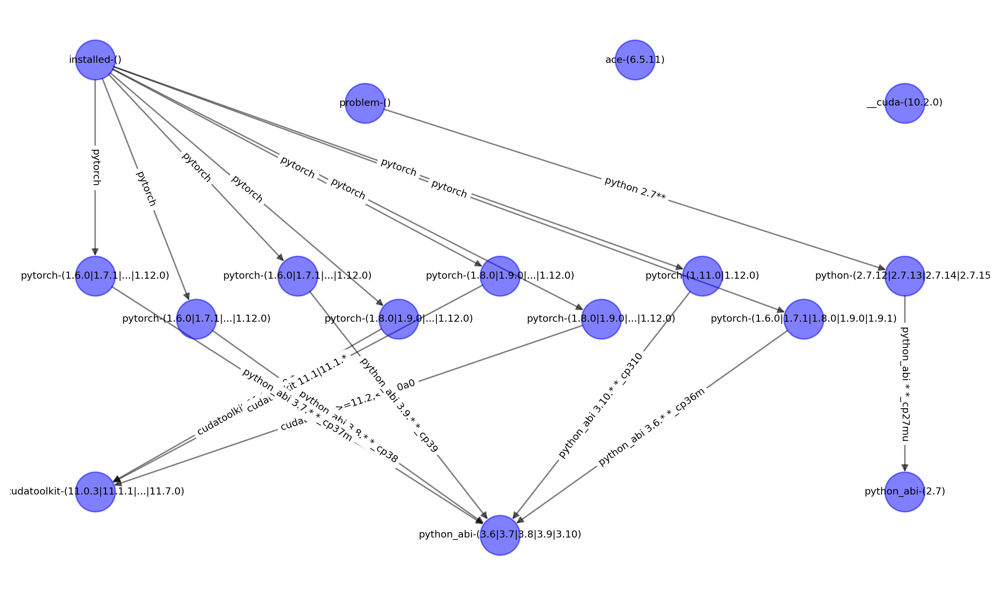

================================================== New error message ===================================================
Error: Could not find any installable versions for requested package python 2.7**.

The following requirements limit the allowed versions of downstream packages:
  pytorch is requested, with the potential options
    pytorch [1.8.0|1.9.1|1.6.0|1.7.1|1.9.0], which requires
      python_abi 3.6.* *_cp36m, which can be installed;
    pytorch [1.12.0|1.11.0], which requires
      python_abi 3.10.* *_cp310, which can be installed;
    pytorch [1.12.0|1.8.0|...|1.11.0|1.9.0], which requires
      cudatoolkit >=11.2,<12.0a0, which can be installed;
    pytorch [1.12.0|1.8.0|...|1.11.0|1.9.0], which requires
      cudatoolkit 11.1|11.1.*, which can be installed;
    pytorch [1.12.0|1.8.0|...|1.11.0|1.9.0], which requires
      cudatoolkit 11.0|11.0.*, which can be installed;
    pytorch [1.12.0|1.8.0|...|1.7.1|1.9.0], which requires
      python_abi 3.9.* *_cp39, which can b

In [8]:
detail_problem(mer.problems.create_pytorch_cuda)

# SCIP

conda-forge/linux-64                                        Using cache
conda-forge/noarch                                          Using cache
================================================== Old error message ===================================================
Mamba failed to solve. The reported errors are:
   Encountered problems while solving:
     - package pyscipopt-3.0.4b-py36ha03b18c_1 requires scip >=7.0.2,<8.0a0, but none of the providers can be installed
   
==================================================== Original graph ====================================================


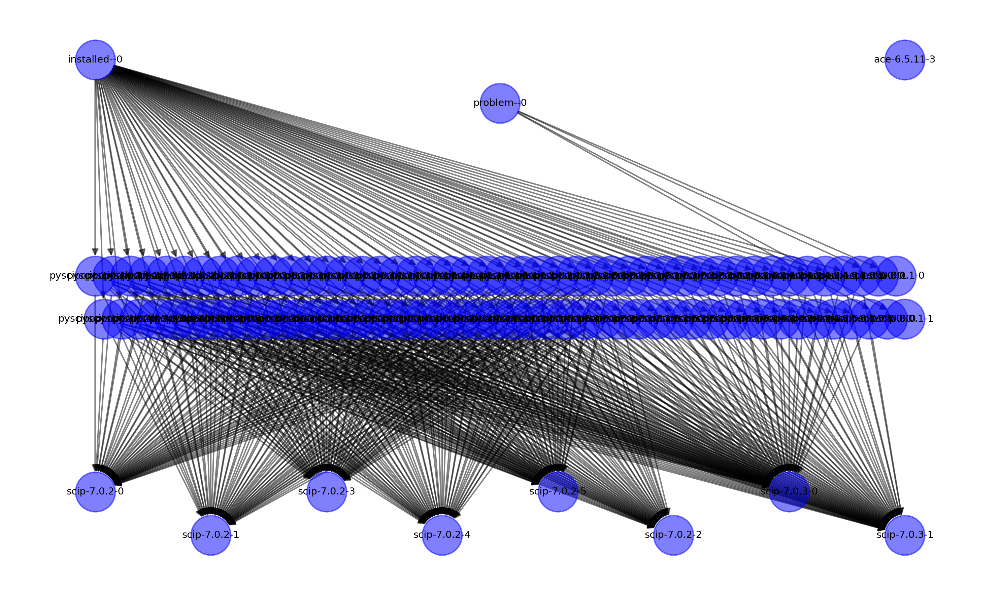

=================================================== Compressed graph ===================================================


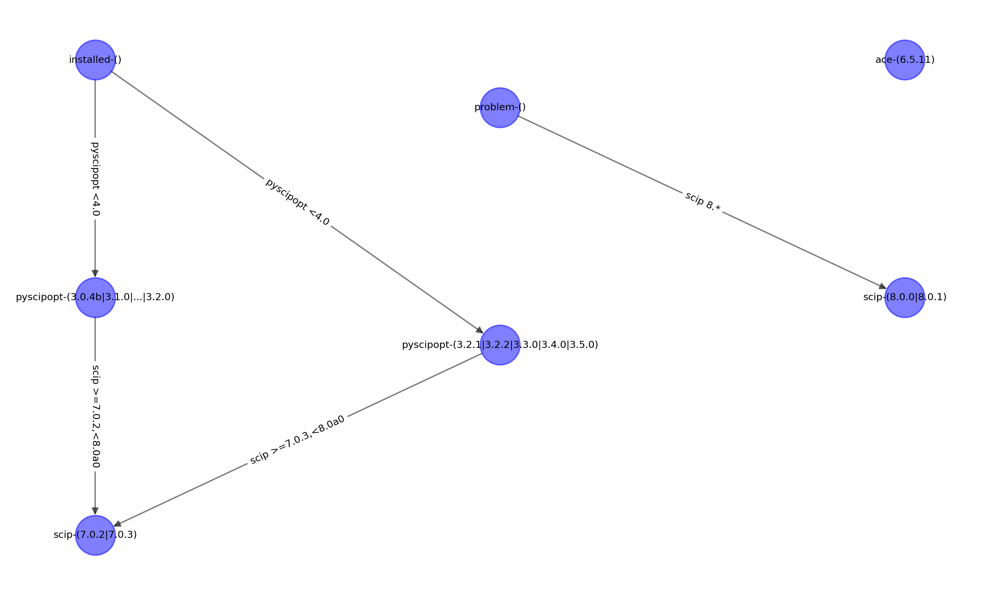

================================================== New error message ===================================================
Error: Could not find any installable versions for requested package scip 8.*.

The following requirements limit the allowed versions of downstream packages:
  pyscipopt <4.0 is requested, with the potential options
    pyscipopt [3.2.1|3.5.0|3.3.0|3.2.2|3.4.0], which requires
      scip >=7.0.3,<8.0a0, which can be installed;
    pyscipopt [3.0.4b|3.1.0|...|3.1.1|3.1.2], which requires
      scip >=7.0.2,<8.0a0, which can be installed.

The following packages could not be installed:
  scip 8.*, which conflicts with any installable versions of scip.


In [9]:
detail_problem(mer.problems.create_scip)

# JupyterLab OpenSSL

conda-forge/linux-64                                        Using cache
conda-forge/noarch                                          Using cache
================================================== Old error message ===================================================
Mamba failed to solve. The reported errors are:
   Encountered problems while solving:
     - package jupyterlab-3.0.1-pyhd8ed1ab_0 requires jupyterlab_server >=2.0.0,<3.0.0, but none of the providers can be installed
   
==================================================== Original graph ====================================================


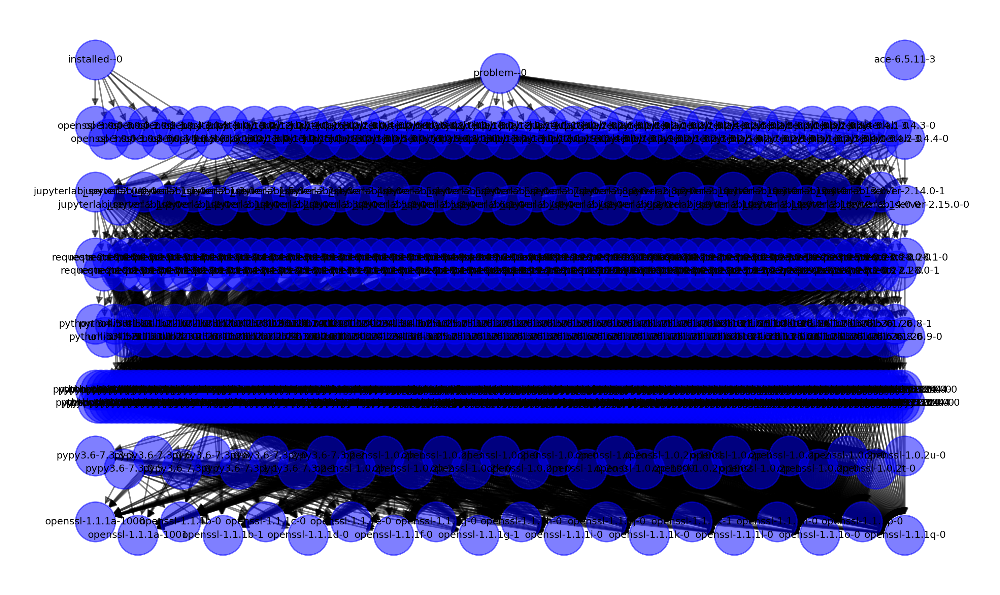

=================================================== Compressed graph ===================================================


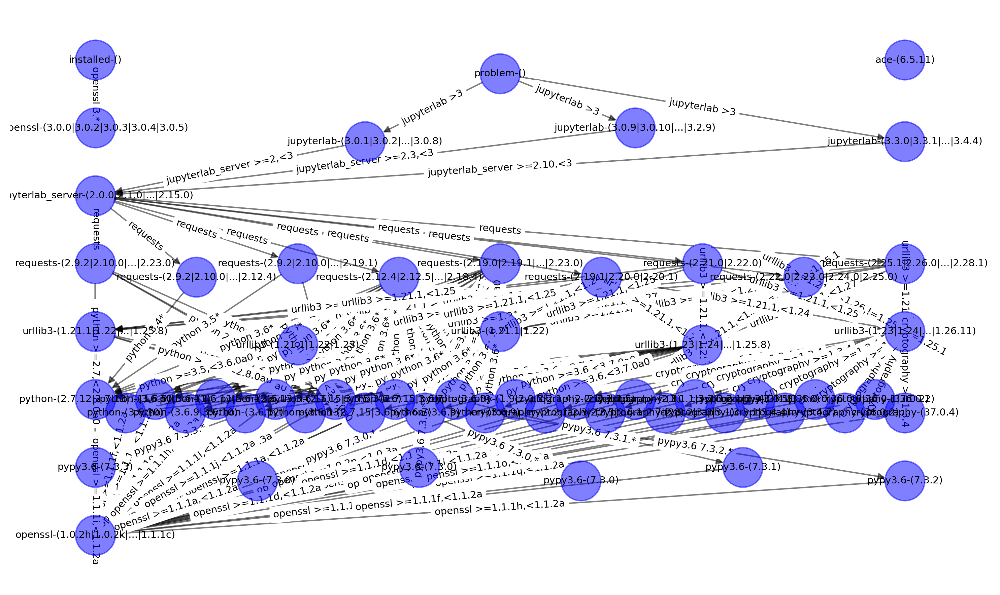

================================================== New error message ===================================================
Error: Could not find any installable versions for requested package jupyterlab >3.

The following requirements limit the allowed versions of downstream packages:
  openssl 3.* is directly requested.

The following packages could not be installed:
  jupyterlab >3 for which none of the following versions can be installed
    jupyterlab [3.4.4|3.3.1|...|3.3.4|3.3.2] which requires
      jupyterlab_server >=2.10,<3 which requires
        requests for which none of the following versions can be installed
          requests [2.25.1|2.27.1|...|2.27.0|2.28.1] which requires
            urllib3 >=1.21.1,<1.27 for which none of the following versions can be installed
              urllib3 [1.24.3|1.24|...|1.26.1|1.25.6] which requires
                cryptography >=1.3.4 for which none of the following versions can be installed
                  cryptography [37.0.4] which re

In [10]:
detail_problem(mer.problems.create_jupyterlab)